<a href="https://colab.research.google.com/github/duonghung86/Vehicle-trajectory-tracking/blob/master/Codes/VTP_0_Data_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Load a dataset from US-101 datasets 

In [3]:
from io import StringIO
from io import BytesIO
from zipfile import ZipFile
import urllib.request

def zip2df(link):
    # Open the url link
    url = urllib.request.urlopen(link)
    
    # Open as zip file
    with ZipFile(BytesIO(url.read())) as my_zip_file:
        for contained_file in my_zip_file.namelist():
            fzip=my_zip_file.open(contained_file)
            print(contained_file)
            data=fzip.read()
    # Convert bytes object to string object
    s=str(data,'utf-8')
    data = StringIO(s) 
    # convert it to pandas DataFrame as normal csv file
    df=pd.read_csv(data)
    return df

In [4]:
link_0750 = 'https://github.com/duonghung86/Vehicle-trajectory-tracking/raw/master/Data/NGSIM/US-101-LosAngeles-CA/vehicle-trajectory-data/0750_0805_us101_smoothed_11_.zip'

df=zip2df(link_0750)
df.info()
df.head()

0750_0805_us101_smoothed_11_.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 18 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   Vehicle_ID    1048575 non-null  int64  
 1   Frame_ID      1048575 non-null  int64  
 2   Total_Frames  1048575 non-null  int64  
 3   Global_Time   1048575 non-null  int64  
 4   Local_X       1048575 non-null  float64
 5   Local_Y       1048575 non-null  float64
 6   Global_X      1048575 non-null  float64
 7   Global_Y      1048575 non-null  float64
 8   v_Length      1048575 non-null  float64
 9   v_Width       1048575 non-null  float64
 10  v_Class       1048575 non-null  int64  
 11  v_Vel         1048575 non-null  float64
 12  v_Acc         1048575 non-null  float64
 13  Lane_ID       1048575 non-null  int64  
 14  Preceeding    1048575 non-null  int64  
 15  Following     1048575 non-null  int64  
 16  Space_Hdwy    1048575 non-null  float64

,Vehicle_ID,Frame_ID,Total_Frames,Global_Time,Local_X,Local_Y,Global_X,Global_Y,v_Length,v_Width,v_Class,v_Vel,v_Acc,Lane_ID,Preceeding,Following,Space_Hdwy,Time_Hdwy
0,2,13,437,1118846980200,16.467196,35.380427,6451137.641,1873344.962,14.5,4.9,2,40.000000,0.000000,2,0,0,0.0,0.0
1,2,14,437,1118846980300,16.446594,39.381608,6451140.329,1873342.000,14.5,4.9,2,40.012349,0.123485,2,0,0,0.0,0.0
2,2,15,437,1118846980400,16.425991,43.381541,6451143.018,1873339.038,14.5,4.9,2,39.999855,-0.124939,2,0,0,0.0,0.0
3,2,16,437,1118846980500,16.405392,47.380780,6451145.706,1873336.077,14.5,4.9,2,39.992920,-0.069349,2,0,0,0.0,0.0
4,2,17,437,1118846980600,16.384804,51.379881,6451148.395,1873333.115,14.5,4.9,2,39.991544,-0.013759,2,0,0,0.0,0.0


|Variable|Description|
|---|:--|
|Vehicle_ID| Vehicle identification number|
|Frame_ID| Frame Identification number|
|Total_Frames| Total number of frames in which the vehicle appears in this data set|
|Global_Time| Elapsed time in milliseconds since Jan 1, 1970.|
|Local_X| Lateral (X) coordinate of the front center of the vehicle in feet with respect to the left-most edge of the section in the direction of travel|
|Local_Y| Longitudinal (Y) coordinate of the front center of the vehicle in feet with respect to the entry edge of the section in the direction of travel|
|Global_X| of the front center of the vehicle in feet based on the coordinate CA State Plane III in NAD83|
|Global_Y| Y Coordinate of the front center of the vehicle in feet based on the coordinate CA State Plane III in NAD83|
|v_Length| Length of vehicle in feet|
|v_Width| Width of vehicle in feet|
|v_Class| Vehicle type: 1 - motorcycle, 2 - auto, 3 - truck|
|v_Vel| Instantaneous velocity of vehicle in feet/second|
|v_Acc| Instantaneous acceleration of vehicle in feet/second square|
|Lane_ID| Current lane position of vehicle. Lane 1 is farthest left lane; lane 5 is farthest right lane. Lane 6 is the auxiliary lane between Ventura Boulevard on-ramp and the Cahuenga Boulevard off-ramp. Lane 7 is the on-ramp at Ventura Boulevard, and Lane 8 is the off-ramp at Cahuenga Boulevard|
|Preceding| Vehicle ID of the lead vehicle in the same lane. A value of '0' represents no preceding vehicle - occurs at the end of the study section and off-ramp due to the fact that only complete trajectories were recorded by this data collection effort|
|Following| Vehicle ID of the vehicle following the subject vehicle in the same lane. A value of '0' represents no following vehicle - occurs at the beginning of the study section and on ramp due to the fact that only complete trajectories were recorded by this data collection effort|
|Space_Headway| Space Headway in feet. Spacing provides the distance between the front-center of a vehicle to the front-center of the preceding vehicle.|
|Time_Headway| Time Headway provides the time in seconds needed to travel from the front-center of a vehicle (at the speed of the vehicle) to the front-center of the preceding vehicle. A headway value of 9999.99 means that the vehicle is traveling at zero speed (congested conditions).|

We should add more features such as:
- Vehicle's direction
- Information on surrounding vehicles (here they only care about the preceding and following vehicle)
- Does the car drag a cargo? 
- Traffic signal ahead

# Data exploration

In [5]:
# Vehicle_ID

print('The number of vehicles in the dataset is {}'.format(len(df.Vehicle_ID.unique())))


The number of vehicles in the dataset is 1993


There are no missing values in the dataset


In [6]:
# Global time
print('The time length of the dataset is {} milisecond'.format(df.Global_Time.max()-df.Global_Time.min()))

The time length of the dataset is 889800 milisecond


In [7]:
# Statistic information
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Vehicle_ID,1048575.0,1.533080e+03,790.270619,2.000000e+00,9.320000e+02,1.574000e+03,2.210000e+03,2.783000e+03
Frame_ID,1048575.0,4.518249e+03,2412.479140,8.000000e+00,2.455000e+03,4.586000e+03,6.598000e+03,8.906000e+03
Total_Frames,1048575.0,5.608766e+02,146.576725,1.770000e+02,4.640000e+02,5.180000e+02,6.400000e+02,1.010000e+03
Global_Time,1048575.0,1.118847e+12,241247.913966,1.118847e+12,1.118847e+12,1.118847e+12,1.118848e+12,1.118848e+12
Local_X,1048575.0,2.940562e+01,16.666409,5.336573e-01,1.728364e+01,2.955705e+01,4.187527e+01,7.347849e+01
Local_Y,1048575.0,1.002056e+03,596.356952,1.796560e+01,4.883959e+02,9.640279e+02,1.491548e+03,2.195470e+03
Global_X,1048575.0,6.451838e+06,446.275438,6.451107e+06,6.451450e+06,6.451808e+06,6.452205e+06,6.452734e+06
Global_Y,1048575.0,1.872677e+06,397.005822,1.871875e+06,1.872352e+06,1.872699e+06,1.873015e+06,1.873365e+06
v_Length,1048575.0,1.463523e+01,4.870300,4.000000e+00,1.200000e+01,1.450000e+01,1.650000e+01,7.610000e+01
v_Width,1048575.0,6.132122e+00,1.037172,2.000000e+00,5.400000e+00,6.000000e+00,6.900000e+00,8.500000e+00


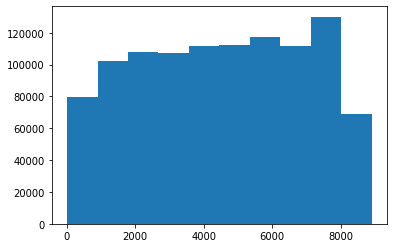

In [8]:
# Frame ID

plt.hist(df.Frame_ID)
plt.show()

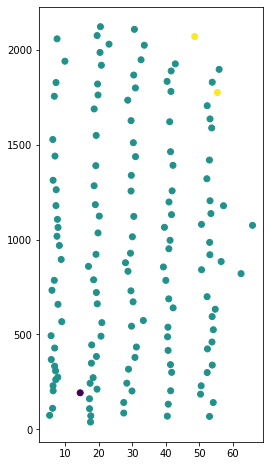

In [9]:
a_frame = df[df.Frame_ID == 7500]
plt.figure(figsize=(4,8))
plt.scatter(a_frame.Local_X,a_frame.Local_Y,c=a_frame.v_Class)
plt.show()

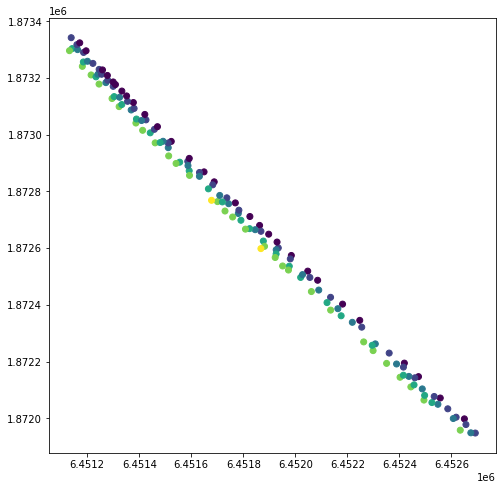

In [30]:
plt.figure(figsize=(8,8))
plt.scatter(a_frame.Global_X,a_frame.Global_Y,c=a_frame.Lane_ID)
plt.show()

In [11]:
def box_hist_plot(arr):
  f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
  # Add a graph in each part
  sns.boxplot(arr, ax=ax_box)
  sns.distplot(arr, ax=ax_hist)
 
  # Remove x axis name for the boxplot
  ax_box.set(xlabel='')

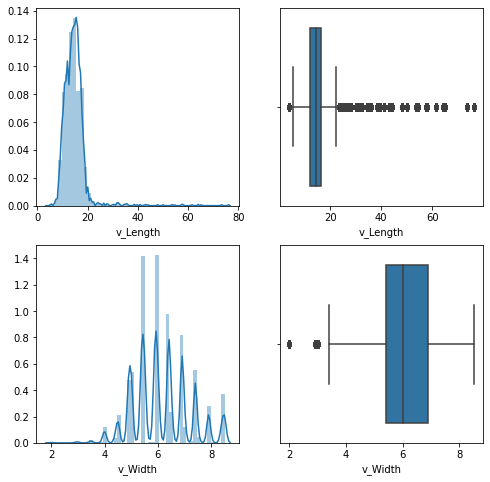

In [12]:
# v_length and v_width
plt.figure(figsize=(8,8))
plt.subplot(2,2,1)
sns.distplot(df.v_Length)
plt.subplot(2,2,2)
sns.boxplot(df.v_Length)

plt.subplot(2,2,3)
sns.distplot(df.v_Width)
plt.subplot(2,2,4)
sns.boxplot(df.v_Width)
plt.show()

Most of the cars have length below 20 feet and width around 6 feet

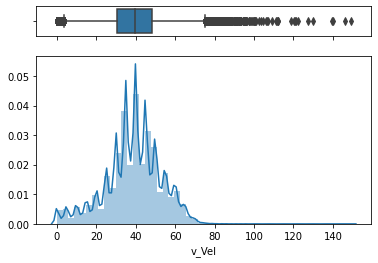

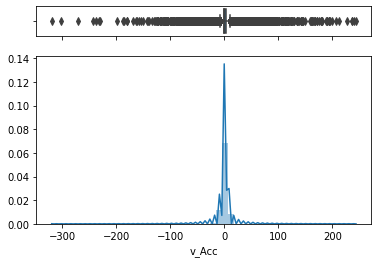

In [13]:
# v_Vel and v_Acc
box_hist_plot(df.v_Vel)
box_hist_plot(df.v_Acc)

The distributions of speed and acceleration are normal but there are many outliers.

In [14]:
# check a random vehicle
df_test = df[df.Vehicle_ID == 2]
df_test

,Vehicle_ID,Frame_ID,Total_Frames,Global_Time,Local_X,Local_Y,Global_X,Global_Y,v_Length,v_Width,v_Class,v_Vel,v_Acc,Lane_ID,Preceeding,Following,Space_Hdwy,Time_Hdwy
0,2,13,437,1118846980200,16.467196,35.380427,6451137.641,1873344.962,14.5,4.9,2,40.000000,0.000000,2,0,0,0.0,0.0
1,2,14,437,1118846980300,16.446594,39.381608,6451140.329,1873342.000,14.5,4.9,2,40.012349,0.123485,2,0,0,0.0,0.0
2,2,15,437,1118846980400,16.425991,43.381541,6451143.018,1873339.038,14.5,4.9,2,39.999855,-0.124939,2,0,0,0.0,0.0
3,2,16,437,1118846980500,16.405392,47.380780,6451145.706,1873336.077,14.5,4.9,2,39.992920,-0.069349,2,0,0,0.0,0.0
4,2,17,437,1118846980600,16.384804,51.379881,6451148.395,1873333.115,14.5,4.9,2,39.991544,-0.013759,2,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
432,2,445,437,1118847023400,8.950828,2102.118765,6452682.369,1871970.310,14.5,4.9,2,70.047545,0.022158,1,0,10,0.0,0.0
433,2,446,437,1118847023500,8.895796,2109.123121,6452687.876,1871965.973,14.5,4.9,2,70.045728,-0.018168,1,0,10,0.0,0.0
434,2,447,437,1118847023600,8.785970,2116.125464,6452693.342,1871961.615,14.5,4.9,2,70.032039,-0.136895,1,0,10,0.0,0.0
435,2,448,437,1118847023700,8.606811,2123.124161,6452699.130,1871957.648,14.5,4.9,2,70.009897,-0.221416,1,0,10,0.0,0.0


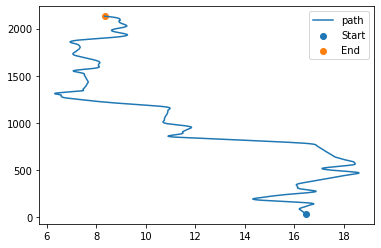

In [27]:
# Plot vehicle path
def plot_path(data):
  length = len(data)
  plt.scatter(data.Local_X.values[0],data.Local_Y.values[0], label= 'Start')
  plt.plot(data.Local_X.values,data.Local_Y.values,label = 'path')
  plt.scatter(data.Local_X.values[length - 1],data.Local_Y.values[length - 1], label= 'End')
  plt.legend()
  plt.show()

plot_path(df_test)

In [ ]:
# Extremly high speed vehicles
df[df.v_Vel >140]

,Vehicle_ID,Frame_ID,Total_Frames,Global_Time,Local_X,Local_Y,Global_X,Global_Y,v_Length,v_Width,v_Class,v_Vel,v_Acc,Lane_ID,Preceeding,Following,Space_Hdwy,Time_Hdwy
275544,970,2614,268,1118847240300,70.435783,1419.322692,6452122.897,1872369.678,18.0,8.4,2,140.102494,194.790358,8,0,0,0.0,0.0
516097,1554,4833,678,1118847462200,8.451909,1976.193995,6452584.424,1872050.613,15.0,6.9,2,149.052378,96.759633,1,0,1556,0.0,0.0
516098,1554,4834,678,1118847462300,8.487065,1990.792590,6452599.173,1872038.146,15.0,6.9,2,145.986367,-30.660103,1,0,1556,0.0,0.0


In [24]:
df[df.Vehicle_ID == 1554].Local_X.values[0]

5.440013986013991

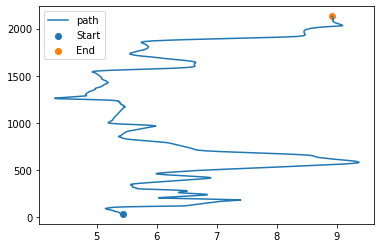

In [28]:
# Extremly high speed vehicles
df[df.Vehicle_ID == 1554]
plot_path(df[df.Vehicle_ID == 1554])

In [ ]:
# Extremly high acceleration vehicles
df[df.v_Acc >200]

,Vehicle_ID,Frame_ID,Total_Frames,Global_Time,Local_X,Local_Y,Global_X,Global_Y,v_Length,v_Width,v_Class,v_Vel,v_Acc,Lane_ID,Preceeding,Following,Space_Hdwy,Time_Hdwy
411319,1259,3986,548,1118847377500,5.332545,2123.120028,6452703.524,1871958.366,12.5,5.5,2,127.392634,240.699774,1,0,1267,0.0,0.0
414507,1271,3986,544,1118847377500,28.205476,2136.877776,6452700.267,1871932.535,12.0,4.0,2,118.927502,226.642166,3,0,1277,0.0,0.0
516095,1554,4831,678,1118847462000,8.461049,1947.351119,6452556.744,1872073.641,15.0,6.9,2,121.474440,207.232772,1,0,1556,0.0,0.0
608653,1756,5484,443,1118847527300,53.103923,2128.121350,6452677.890,1871918.121,10.5,5.5,2,122.150462,235.496123,5,0,1760,0.0,0.0
620926,1778,5604,674,1118847539300,17.723916,2125.487189,6452697.781,1871947.919,12.5,5.0,2,112.292162,211.750846,2,0,1784,0.0,0.0
1004748,2700,8603,867,1118847839200,28.249175,2136.705622,6452700.200,1871932.531,14.0,5.9,2,106.222248,243.002553,3,0,2713,0.0,0.0
1025255,2732,8683,850,1118847847200,20.895182,2126.109231,6452696.039,1871944.164,13.5,5.9,2,107.053046,236.777012,2,0,2741,0.0,0.0


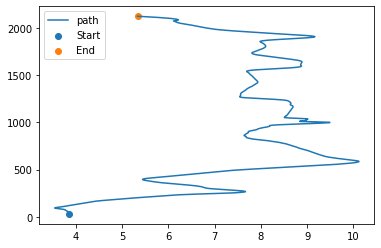

In [29]:
plot_path(df[df.Vehicle_ID == 1259])

# Animation

In [32]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [33]:
%pip install celluloid
from celluloid import Camera

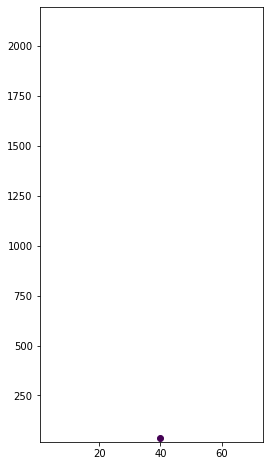

In [34]:
# Set frame
fig, ax = plt.subplots(figsize=(4, 8))
ax.set(xlim=(df.Local_X.min(), df.Local_X.max()), ylim=(df.Local_Y.min(), df.Local_Y.max()))

#frame = ax.scatter(first_frame.Local_X, first_frame.Local_Y, color='black', lw=4)

camera = Camera(fig)
# draw only first 400 frame 
for i in range(400):
    frame_data = df[df.Frame_ID == i+8]
    ax.scatter(frame_data.Local_X, frame_data.Local_Y,c=frame_data.Lane_ID)
    plt.pause(0.001)
    camera.snap()

animation = camera.animate()
#HTML(animation.to_html5_video())
HTML(animation.to_jshtml())

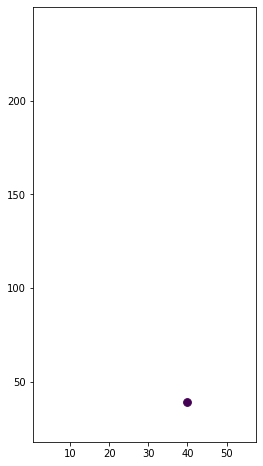

In [43]:
# Set frame
fig, ax = plt.subplots(figsize=(4, 8))
df_test = df[df['Local_Y'] < 250]
ax.set(xlim=(df_test.Local_X.min(), df_test.Local_X.max()), ylim=(df_test.Local_Y.min(), df_test.Local_Y.max()))

#frame = ax.scatter(first_frame.Local_X, first_frame.Local_Y, color='black', lw=4)

camera = Camera(fig)
# draw only first 500 frame 
for i in range(500):
    frame_data = df_test[df_test.Frame_ID == i+8]
    ax.scatter(frame_data.Local_X, frame_data.Local_Y,c=frame_data.Lane_ID,s=frame_data.v_Class*30)
    plt.pause(0.001)
    camera.snap()

animation = camera.animate()
#HTML(animation.to_html5_video())
HTML(animation.to_jshtml())